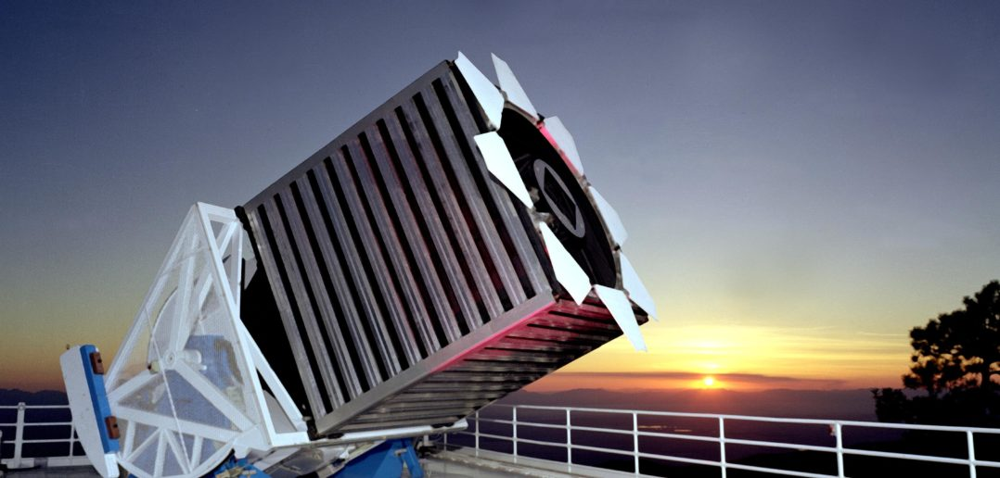

In [84]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [85]:
df=pd.read_csv('space_server.csv')
df

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,STAR,-0.000009,3306,54922,491
1,1.237650e+18,183.598371,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,STAR,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,GALAXY,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,STAR,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,STAR,0.000590,3306,54922,512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.237650e+18,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,301,3,161,5.033450e+17,GALAXY,0.027583,447,51877,246
9996,1.237650e+18,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,301,3,162,5.033400e+17,GALAXY,0.117772,447,51877,228
9997,1.237650e+18,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,301,3,162,8.222620e+18,STAR,-0.000402,7303,57013,622
9998,1.237650e+18,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,301,3,163,5.033400e+17,GALAXY,0.014019,447,51877,229


objid = Object Identifier
ra = J2000 Right Ascension (r-band)
dec = J2000 Declination (r-band)
u = better of DeV/Exp magnitude fit
g = better of DeV/Exp magnitude fit
r = better of DeV/Exp magnitude fit
i = better of DeV/Exp magnitude fit
z = better of DeV/Exp magnitude fit
run = Run Number
rereun = Rerun Number
camcol = Camera column
field = Field number
specobjid = Object Identifier
class = object class (galaxy, star or quasar object)
redshift = Final Redshift
plate = plate number
mjd = MJD of observation
fiberid = fiber ID

In [86]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   objid      10000 non-null  float64
 1   ra         10000 non-null  float64
 2   dec        10000 non-null  float64
 3   u          10000 non-null  float64
 4   g          10000 non-null  float64
 5   r          10000 non-null  float64
 6   i          10000 non-null  float64
 7   z          10000 non-null  float64
 8   run        10000 non-null  int64  
 9   rerun      10000 non-null  int64  
 10  camcol     10000 non-null  int64  
 11  field      10000 non-null  int64  
 12  specobjid  10000 non-null  float64
 13  class      10000 non-null  object 
 14  redshift   10000 non-null  float64
 15  plate      10000 non-null  int64  
 16  mjd        10000 non-null  int64  
 17  fiberid    10000 non-null  int64  
dtypes: float64(10), int64(7), object(1)
memory usage: 1.4+ MB


In [87]:
df.isnull().sum()

objid        0
ra           0
dec          0
u            0
g            0
r            0
i            0
z            0
run          0
rerun        0
camcol       0
field        0
specobjid    0
class        0
redshift     0
plate        0
mjd          0
fiberid      0
dtype: int64

There are no missing values

In [88]:
df['class'].value_counts()

GALAXY    4998
STAR      4152
QSO        850
Name: class, dtype: int64

In [89]:
df.describe()

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,redshift,plate,mjd,fiberid
count,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.0,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000
mean,1.237650e+18,175.529987,14.836148,18.619355,17.371931,16.840963,16.583579,16.422833,981.034800,301.0,3.648700,302.380100,1.645022e+18,0.143726,1460.986400,52943.533300,353.069400
std,1.577039e+05,47.783439,25.212207,0.828656,0.945457,1.067764,1.141805,1.203188,273.305024,0.0,1.666183,162.577763,2.013998e+18,0.388774,1788.778371,1511.150651,206.298149
min,1.237650e+18,8.235100,-5.382632,12.988970,12.799550,12.431600,11.947210,11.610410,308.000000,301.0,1.000000,11.000000,2.995780e+17,-0.004136,266.000000,51578.000000,1.000000
25%,1.237650e+18,157.370946,-0.539035,18.178035,16.815100,16.173333,15.853705,15.618285,752.000000,301.0,2.000000,184.000000,3.389248e+17,0.000081,301.000000,51900.000000,186.750000
50%,1.237650e+18,180.394514,0.404166,18.853095,17.495135,16.858770,16.554985,16.389945,756.000000,301.0,4.000000,299.000000,4.966580e+17,0.042591,441.000000,51997.000000,351.000000
75%,1.237650e+18,201.547279,35.649397,19.259232,18.010145,17.512675,17.258550,17.141447,1331.000000,301.0,5.000000,414.000000,2.881300e+18,0.092579,2559.000000,54468.000000,510.000000
max,1.237650e+18,260.884382,68.542265,19.599900,19.918970,24.802040,28.179630,22.833060,1412.000000,301.0,6.000000,768.000000,9.468830e+18,5.353854,8410.000000,57481.000000,1000.000000


There is no larger difference in 75% and max whereas mean and min has larger difference in dec,plate

In [90]:
df.columns

Index(['objid', 'ra', 'dec', 'u', 'g', 'r', 'i', 'z', 'run', 'rerun', 'camcol',
       'field', 'specobjid', 'class', 'redshift', 'plate', 'mjd', 'fiberid'],
      dtype='object')

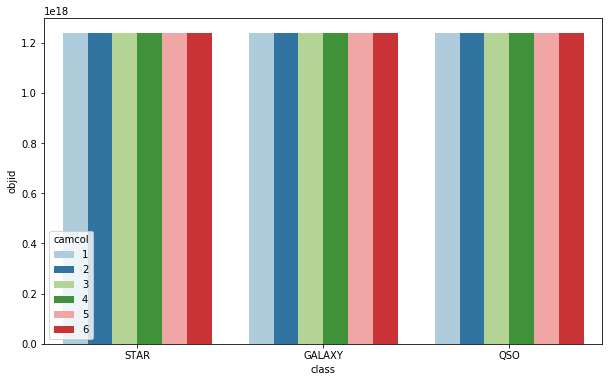

In [91]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='objid',hue='camcol',data=df,palette='Paired')
plt.show()

HERE STAR HAS HIGHER Object Identified

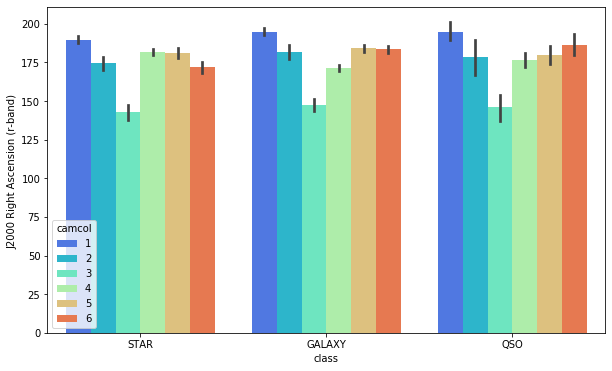

In [92]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='ra',hue='camcol',data=df,palette='rainbow')
plt.ylabel('J2000 Right Ascension (r-band) ')
plt.show()

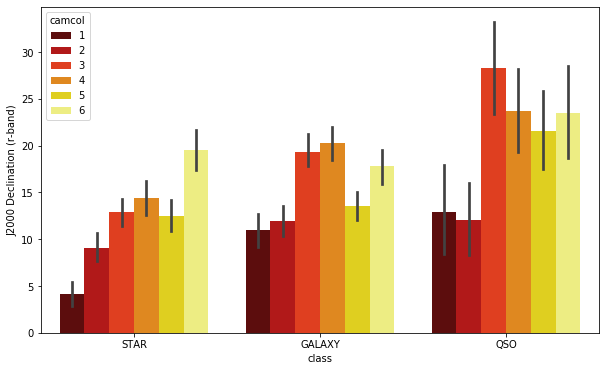

In [93]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='dec',hue='camcol',data=df,palette='hot')
plt.ylabel('J2000 Declination (r-band)')
plt.show()

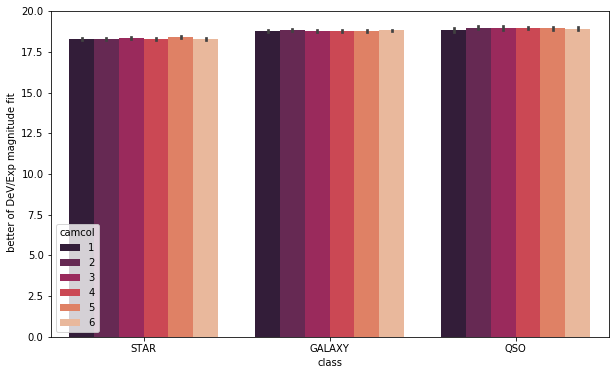

In [94]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='u',hue='camcol',data=df,palette='rocket')
plt.ylabel(' better of DeV/Exp magnitude fit')
plt.show()

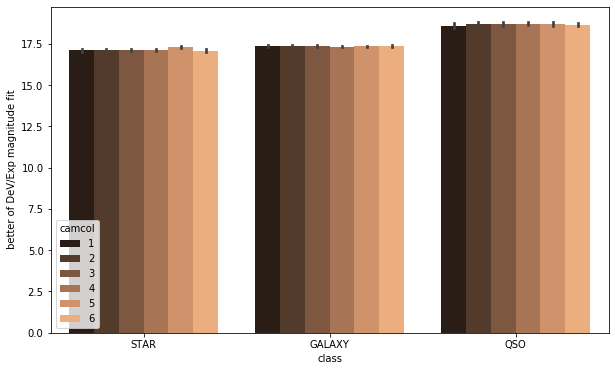

In [95]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='g',hue='camcol',data=df,palette='copper')
plt.ylabel(' better of DeV/Exp magnitude fit')
plt.show()

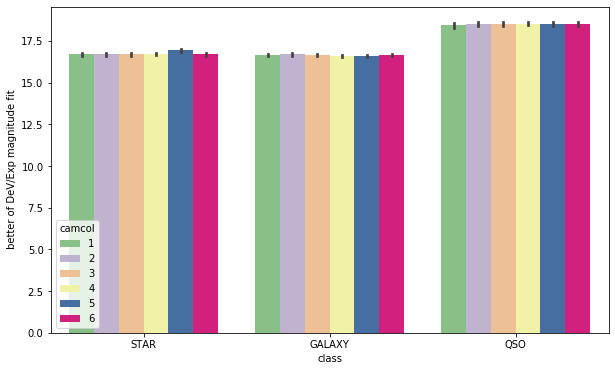

In [96]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='r',hue='camcol',data=df,palette='Accent')
plt.ylabel(' better of DeV/Exp magnitude fit')
plt.show()

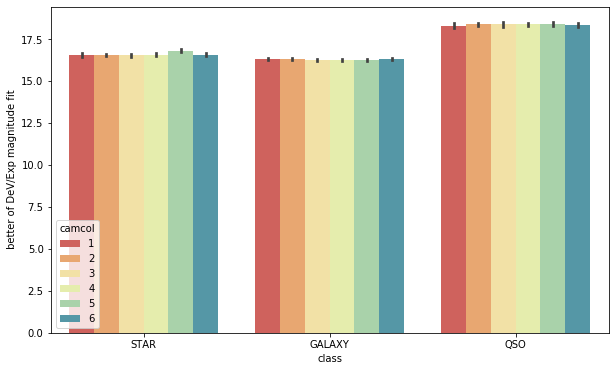

In [97]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='i',hue='camcol',data=df,palette='Spectral')
plt.ylabel(' better of DeV/Exp magnitude fit')
plt.show()

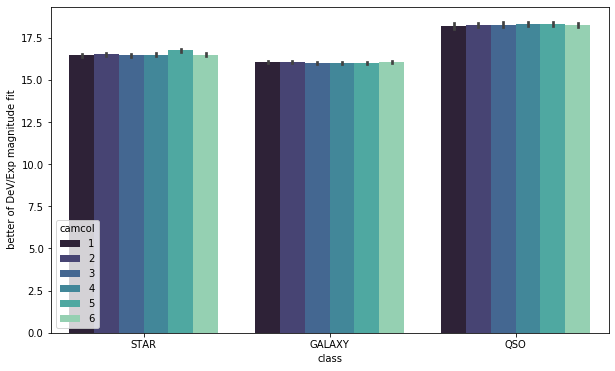

In [98]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='z',hue='camcol',data=df,palette='mako')
plt.ylabel(' better of DeV/Exp magnitude fit')
plt.show()

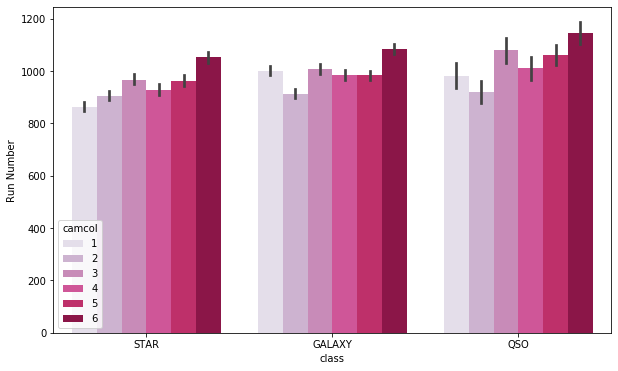

In [99]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='run',hue='camcol',data=df,palette='PuRd')
plt.ylabel('Run Number')
plt.show()

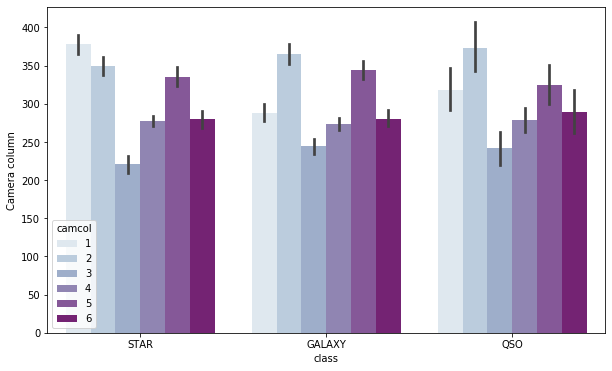

In [100]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='field',hue='camcol',data=df,palette='BuPu')
plt.ylabel('Camera column')
plt.show()

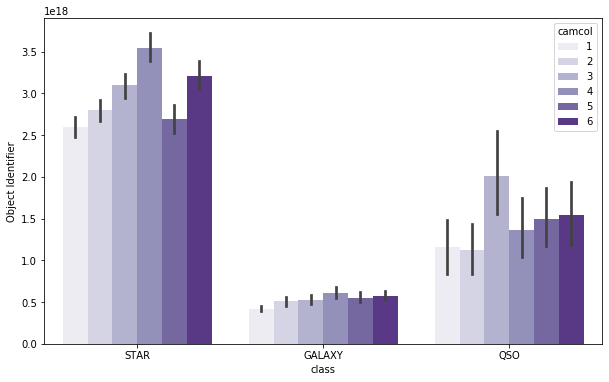

In [101]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='specobjid',hue='camcol',data=df,palette='Purples')
plt.ylabel('Object Identifier')
plt.show()

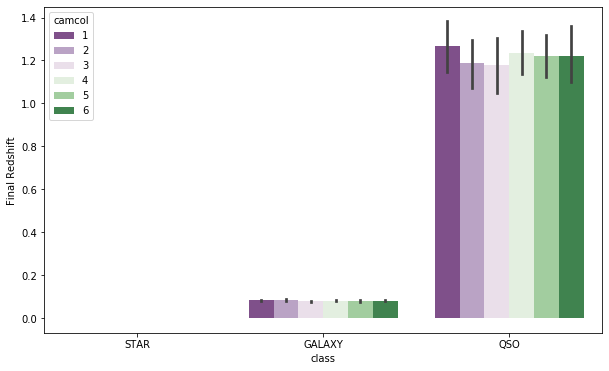

In [102]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='redshift',hue='camcol',data=df,palette='PRGn')
plt.ylabel('Final Redshift')
plt.show()

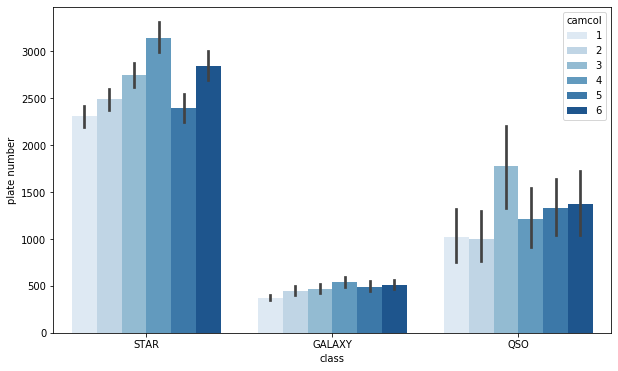

In [103]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='plate',hue='camcol',data=df,palette='Blues')
plt.ylabel('plate number')
plt.show()

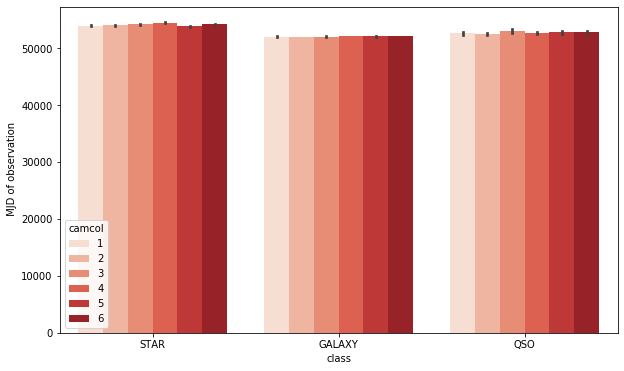

In [104]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='mjd',hue='camcol',data=df,palette='Reds')
plt.ylabel(' MJD of observation')
plt.show()

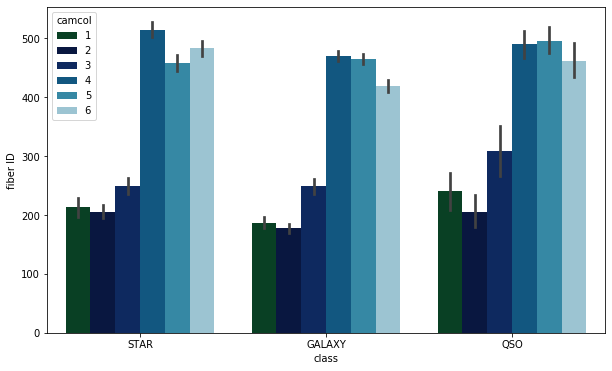

In [105]:
plt.figure(figsize=(10,6))
sns.barplot(x='class',y='fiberid',hue='camcol',data=df,palette='ocean')
plt.ylabel('fiber ID')
plt.show()

In [106]:
from sklearn.preprocessing import LabelEncoder

In [107]:
le=LabelEncoder()

In [108]:
label=le.fit_transform(df['class'])
le.classes_

array(['GALAXY', 'QSO', 'STAR'], dtype=object)

In [109]:
df.drop(columns=['class'])

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,-0.000009,3306,54922,491
1,1.237650e+18,183.598371,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,0.000590,3306,54922,512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.237650e+18,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,301,3,161,5.033450e+17,0.027583,447,51877,246
9996,1.237650e+18,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,301,3,162,5.033400e+17,0.117772,447,51877,228
9997,1.237650e+18,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,301,3,162,8.222620e+18,-0.000402,7303,57013,622
9998,1.237650e+18,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,301,3,163,5.033400e+17,0.014019,447,51877,229


In [110]:
df['class']=label
df

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,2,-0.000009,3306,54922,491
1,1.237650e+18,183.598371,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,2,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,0,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,2,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,2,0.000590,3306,54922,512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.237650e+18,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,301,3,161,5.033450e+17,0,0.027583,447,51877,246
9996,1.237650e+18,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,301,3,162,5.033400e+17,0,0.117772,447,51877,228
9997,1.237650e+18,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,301,3,162,8.222620e+18,2,-0.000402,7303,57013,622
9998,1.237650e+18,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,301,3,163,5.033400e+17,0,0.014019,447,51877,229


In [111]:
dv=df.drop(columns=['objid'])

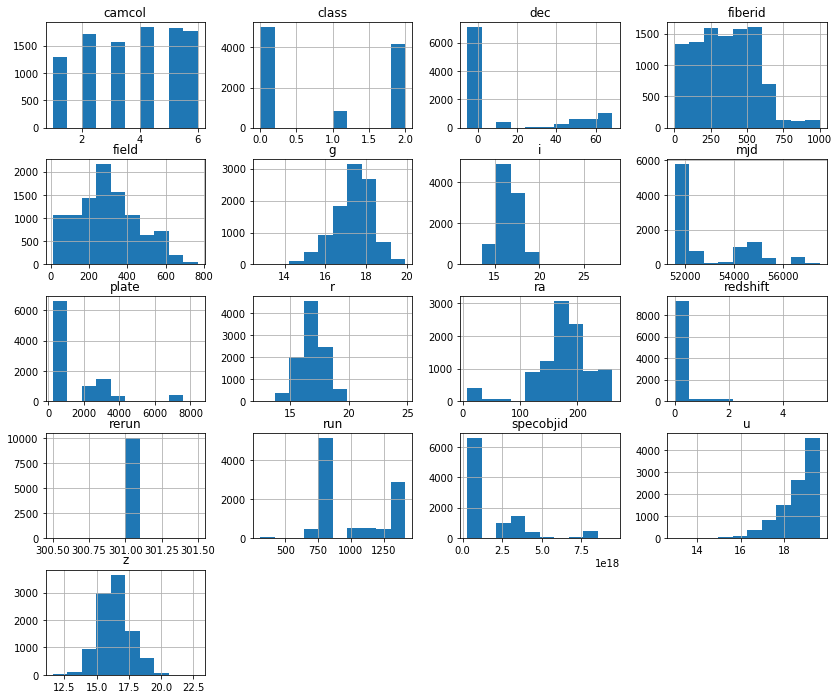

In [112]:
dv.hist(figsize=(14,12))
plt.show()

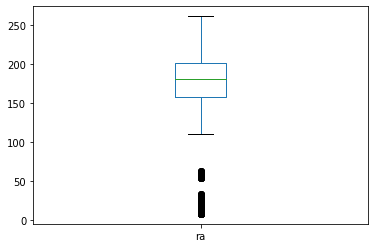

In [113]:
#detect outliers
df['ra'].plot.box()

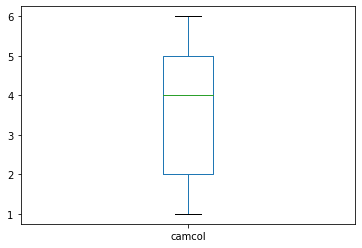

In [114]:
df['camcol'].plot.box()

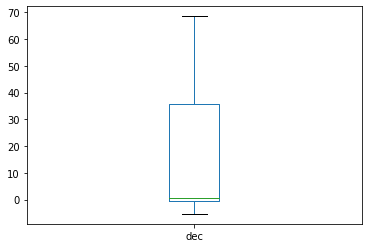

In [115]:
df['dec'].plot.box()

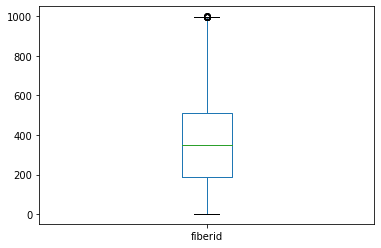

In [116]:
df['fiberid'].plot.box()

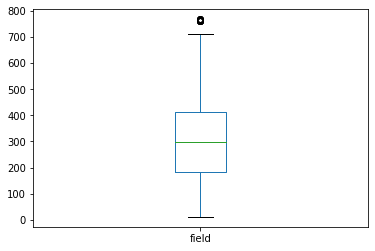

In [117]:
df['field'].plot.box()

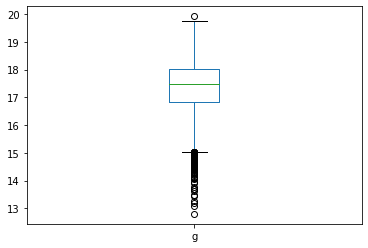

In [118]:
df['g'].plot.box()

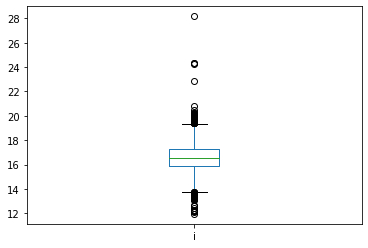

In [119]:
df['i'].plot.box()

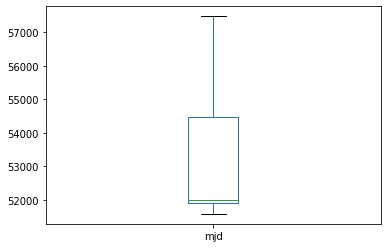

In [120]:
df['mjd'].plot.box()

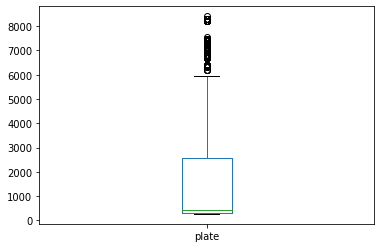

In [121]:
df['plate'].plot.box()

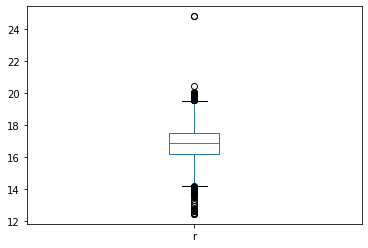

In [122]:
df['r'].plot.box()

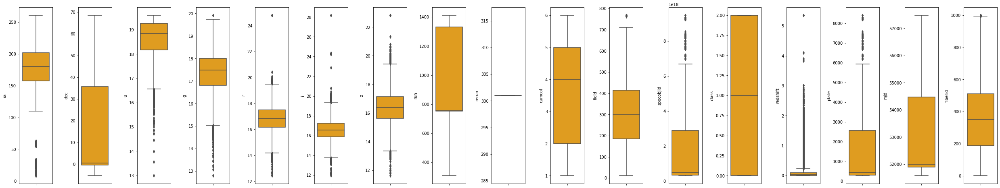

In [123]:
#lets see outliers at a time
collist=df.columns.values
ncol=18
nrows=20
plt.figure(figsize=(2*ncol,7*ncol))
for i in range(1, len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(df[collist[i]],color='orange',orient='v')
    plt.tight_layout()

In [124]:
#lets check the skewness
df.skew()

objid        1.000150
ra          -1.227350
dec          1.191544
u           -1.219795
g           -0.536293
r           -0.021673
i            0.286442
z            0.214313
run          0.412555
rerun        0.000000
camcol      -0.100220
field        0.249795
specobjid    1.794627
class        0.169292
redshift     4.265729
plate        1.794609
mjd          1.039610
fiberid      0.308053
dtype: float64

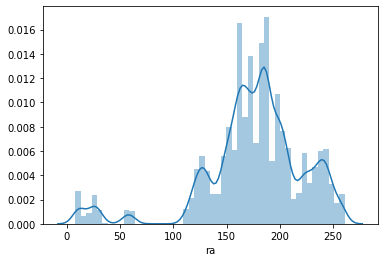

In [125]:
sns.distplot(df['ra'])

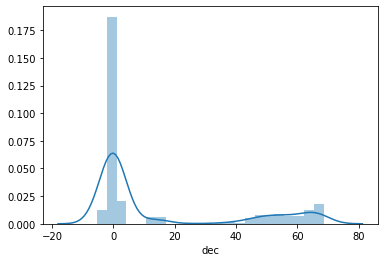

In [126]:
sns.distplot(df['dec'])

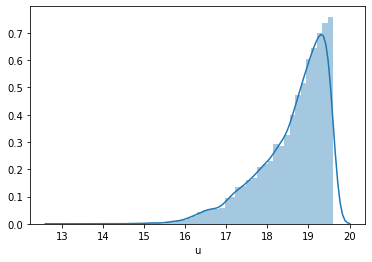

In [127]:
sns.distplot(df['u'])

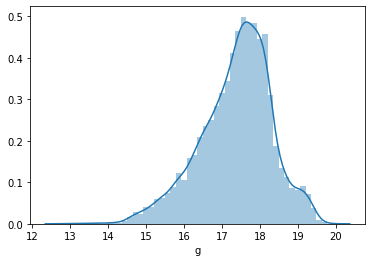

In [128]:
sns.distplot(df['g'])

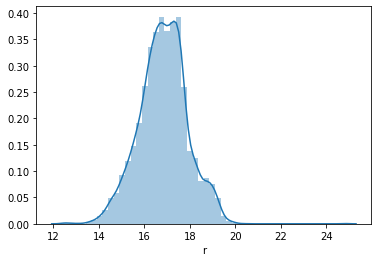

In [129]:
sns.distplot(df['r'])

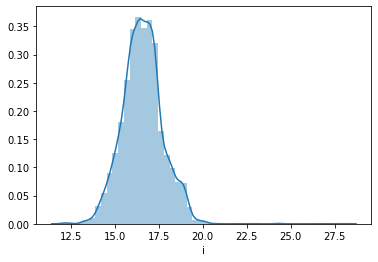

In [130]:
sns.distplot(df['i'])

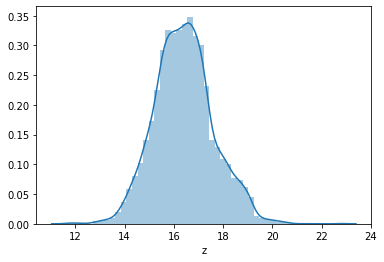

In [131]:
sns.distplot(df['z'])

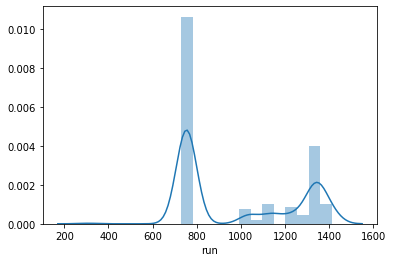

In [132]:
sns.distplot(df['run'])

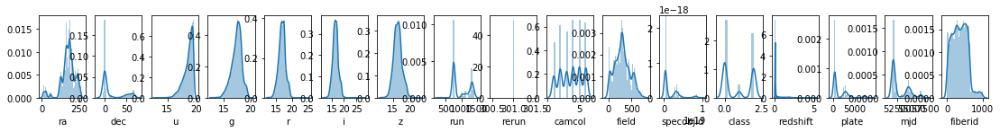

In [133]:
collist=dv.columns.values
ncol=18
nrows=20
plt.figure(figsize=(20,40))
for i in range(0,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.distplot(dv[collist[i]])

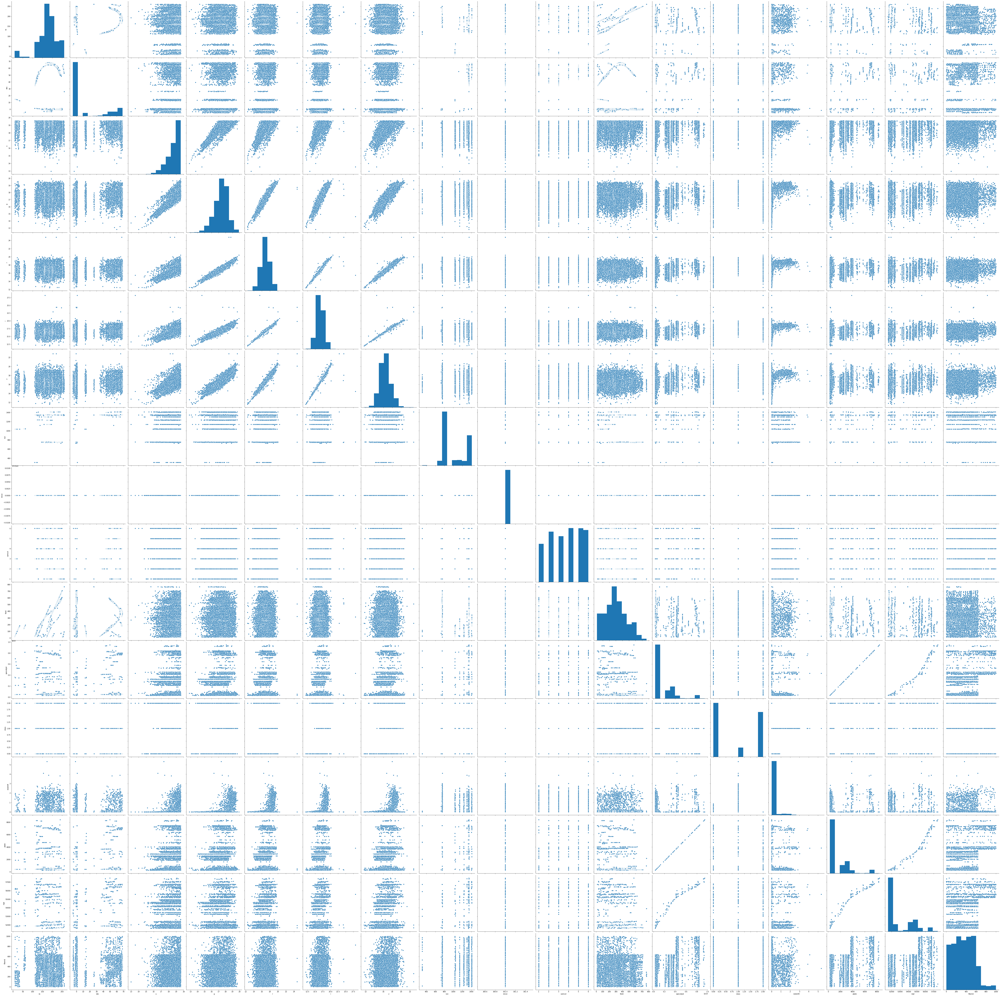

In [134]:
sns.pairplot(dv,size=5)

In [135]:
#check the correlation
df_cor=df.corr()
df_cor

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
objid,1.000000e+00,2.524419e-14,-1.937483e-15,5.581214e-14,1.001149e-13,2.995673e-14,2.212198e-14,-4.107700e-14,-1.553011e-14,NaN,1.921887e-15,5.938881e-16,-1.829075e-15,-3.355500e-15,5.085882e-16,4.156934e-16,-3.317582e-15,4.665195e-15
ra,2.524419e-14,1.000000e+00,3.596046e-03,3.123756e-02,4.390863e-02,4.710290e-02,4.573107e-02,4.294957e-02,-9.274056e-02,NaN,-6.293831e-03,5.946996e-01,-9.532711e-02,-4.321896e-02,3.030740e-02,-9.532933e-02,-8.688726e-02,5.748482e-02
dec,-1.937483e-15,3.596046e-03,1.000000e+00,3.527932e-02,6.187471e-02,6.340395e-02,5.829189e-02,5.687030e-02,7.783849e-01,NaN,1.146139e-01,-1.314714e-01,8.834533e-02,-5.891815e-02,6.702076e-02,8.834153e-02,6.614663e-02,1.550124e-01
u,5.581214e-14,3.123756e-02,3.527932e-02,1.000000e+00,8.492320e-01,6.923790e-01,6.026302e-01,5.514828e-01,3.822910e-02,NaN,9.944672e-03,8.547880e-03,-1.294293e-01,-2.690437e-01,1.637409e-01,-1.294304e-01,-1.687927e-01,1.130112e-02
g,1.001149e-13,4.390863e-02,6.187471e-02,8.492320e-01,1.000000e+00,9.581062e-01,9.074187e-01,8.796222e-01,5.844630e-02,NaN,1.022304e-02,1.465110e-02,-5.497908e-02,-9.921163e-02,4.075763e-01,-5.498078e-02,-9.277155e-02,4.718739e-02
r,2.995673e-14,4.710290e-02,6.340395e-02,6.923790e-01,9.581062e-01,1.000000e+00,9.776718e-01,9.691967e-01,5.726060e-02,NaN,1.074725e-02,1.713294e-02,1.978831e-02,4.962769e-02,4.410797e-01,1.978671e-02,-9.344506e-03,6.108141e-02
i,2.212198e-14,4.573107e-02,5.829189e-02,6.026302e-01,9.074187e-01,9.776718e-01,1.000000e+00,9.815066e-01,4.976478e-02,NaN,1.346079e-02,1.978147e-02,7.295994e-02,1.467908e-01,4.314500e-01,7.295843e-02,5.089616e-02,6.997739e-02
z,-4.107700e-14,4.294957e-02,5.687030e-02,5.514828e-01,8.796222e-01,9.691967e-01,9.815066e-01,1.000000e+00,4.825225e-02,NaN,1.092981e-02,1.824845e-02,1.123981e-01,2.157584e-01,4.240342e-01,1.123969e-01,9.565845e-02,6.797999e-02
run,-1.553011e-14,-9.274056e-02,7.783849e-01,3.822910e-02,5.844630e-02,5.726060e-02,4.976478e-02,4.825225e-02,1.000000e+00,NaN,1.518143e-01,-4.638975e-01,9.360436e-02,-7.816172e-02,5.905595e-02,9.360107e-02,7.035433e-02,1.385659e-01
rerun,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


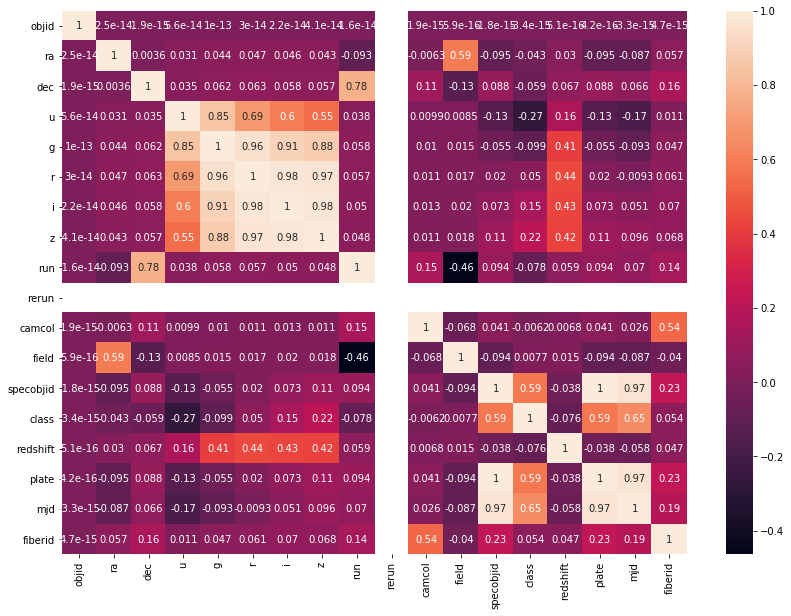

In [136]:
plt.figure(figsize=(14,10))
sns.heatmap(df_cor,annot=True,cmap='rocket')
plt.show()

HERE RERUN SHOWS NON OF THE CORRELATION,HERE GREEN,PURPLE,ORANGE SHOWS NEGATIVE CORRELATION

In [137]:
df

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,2,-0.000009,3306,54922,491
1,1.237650e+18,183.598371,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,2,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,0,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,2,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,2,0.000590,3306,54922,512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.237650e+18,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,301,3,161,5.033450e+17,0,0.027583,447,51877,246
9996,1.237650e+18,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,301,3,162,5.033400e+17,0,0.117772,447,51877,228
9997,1.237650e+18,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,301,3,162,8.222620e+18,2,-0.000402,7303,57013,622
9998,1.237650e+18,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,301,3,163,5.033400e+17,0,0.014019,447,51877,229


lets split the data

In [142]:
x=df.drop(columns=['class'])
x

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,-0.000009,3306,54922,491
1,1.237650e+18,183.598371,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,0.000590,3306,54922,512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.237650e+18,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,301,3,161,5.033450e+17,0.027583,447,51877,246
9996,1.237650e+18,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,301,3,162,5.033400e+17,0.117772,447,51877,228
9997,1.237650e+18,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,301,3,162,8.222620e+18,-0.000402,7303,57013,622
9998,1.237650e+18,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,301,3,163,5.033400e+17,0.014019,447,51877,229


In [143]:
y=pd.DataFrame(df['class'])
y

,class
0,2
1,2
2,0
3,2
4,2
...,...
9995,0
9996,0
9997,2
9998,0


In [144]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[ 0.        ,  0.16745842, -0.58492272, ...,  1.03148936,
         1.30931064,  0.66863177],
       [ 0.        ,  0.16886159, -0.58311429, ..., -0.63621258,
        -0.87919741,  0.91101156],
       [ 0.        ,  0.17057433, -0.58347525, ..., -0.65633905,
        -0.60919097,  0.77527888],
       ...,
       [ 0.        , -0.92039468,  1.46090664, ...,  3.26608697,
         2.69309363,  1.3036668 ],
       [ 0.        , -0.92197294,  1.46432109, ..., -0.56688806,
        -0.70581092, -0.60143828],
       [ 0.        , -0.91804124,  1.46639319, ..., -0.56688806,
        -0.70581092, -0.5820479 ]])

In [205]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB

In [254]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=59,test_size=0.20)

In [255]:
print(x_train.shape,x_test.shape)

(8000, 17) (2000, 17)


In [256]:
print(y_train.shape,y_test.shape)

(8000, 1) (2000, 1)


In [257]:
lr=LogisticRegression()

In [258]:
lr.fit(x_train,y_train)
pred=lr.predict(x_test)
print('Accuracy score:',accuracy_score(y_test,pred))
print('confusion matrix:',confusion_matrix(y_test,pred))
print('classification report:',classification_report(y_test,pred))

Accuracy score: 0.9815
confusion matrix: [[987   2  28]
 [  3 161   0]
 [  3   1 815]]
classification report:               precision    recall  f1-score   support

           0       0.99      0.97      0.98      1017
           1       0.98      0.98      0.98       164
           2       0.97      1.00      0.98       819

    accuracy                           0.98      2000
   macro avg       0.98      0.98      0.98      2000
weighted avg       0.98      0.98      0.98      2000



In [264]:
model=[KNeighborsClassifier(),GaussianNB()]


for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print('Accuracy score of',m,'is:')
    print(accuracy_score(y_test,predm))
    print(confusion_matrix(y_test,predm))
    print(classification_report(y_test,predm))
    print('\n')

Accuracy score of KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform') is:
0.907
[[972   0  45]
 [ 16 144   4]
 [121   0 698]]
              precision    recall  f1-score   support

           0       0.88      0.96      0.91      1017
           1       1.00      0.88      0.94       164
           2       0.93      0.85      0.89       819

    accuracy                           0.91      2000
   macro avg       0.94      0.90      0.91      2000
weighted avg       0.91      0.91      0.91      2000



Accuracy score of GaussianNB(priors=None, var_smoothing=1e-09) is:
0.9535
[[995  16   6]
 [  5 159   0]
 [ 54  12 753]]
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      1017
           1       0.85      0.97      0.91       164
           2       0.99      0.92      0.95       819

    accuracy      

Bagging and boosting

In [202]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(n_estimators=200,random_state=45)
rf.fit(x_train,y_train)
print(rf.score(x_train,y_train))
rfpred=rf.predict(x_test)
print(rfpred)
rf.score(x_test,y_test)

1.0
[2 0 1 ... 0 0 0]


0.991

In [203]:
from sklearn.ensemble import GradientBoostingClassifier
model = GradientBoostingClassifier()
model.fit(x_train,y_train)
model.score(x_test,y_test)

0.9945

In [204]:
from sklearn.ensemble import GradientBoostingClassifier
model = GradientBoostingClassifier()
model.fit(x_train,y_train)
model.score(x_test,y_test)

0.9945

USING GRID SEARCH FIND THE BEST SCORE

In [259]:
from sklearn.model_selection import GridSearchCV

In [261]:
from sklearn.tree import DecisionTreeClassifier
dtc=DecisionTreeClassifier()
grid_param={
    'criterion': ['gini','entropy']
}
gd_sr=GridSearchCV(estimator=dtc,
                   param_grid=grid_param,
                  scoring='accuracy',
                  cv=10)
gd_sr.fit(x,y)

best_parameters=gd_sr.best_params_
print(best_parameters)
best_result=gd_sr.best_score_
print(best_result)

{'criterion': 'entropy'}
0.985


In [265]:
sv=SVC()
grid_param={
    'kernel': ['rbf','linear','poly']
}
gd_sr=GridSearchCV(estimator=sv,
                   param_grid=grid_param,
                  scoring='accuracy',
                  cv=10)
gd_sr.fit(x,y)

best_parameters=gd_sr.best_params_
print(best_parameters)
best_result=gd_sr.best_score_
print(best_result)

{'kernel': 'linear'}
0.9837


Among all these decision tree classifier has highest score 

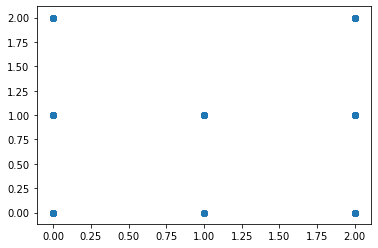

In [271]:
#predicted result
plt.scatter(x=y_test,y=predm)

In [274]:
from joblib import dump,load
dump(df,'SPACE_SERVER_PROJECT.joblib')

['SPACE_SERVER_PROJECT.joblib']